In [1]:
# Import the libraries
import os
import glob
import tqdm
import platform
import pandas as pd
import numpy as np
from PIL import Image
import cv2
from tqdm import tqdm
import matplotlib.pyplot as plt
import skimage
import patchify
import random

In [2]:
# Input directories
img_path ="images/img"
masks_path = "images/masks"

# Output directories
train_img_path = "dataset/train_images/train"
train_masks_path = "dataset/train_masks/train"
val_img_path = "dataset/val_images/val"
val_masks_path ="dataset/val_masks/val"

In [3]:
# Function to delete the non root_mask.tif
def delete_non_root_mask(masks_path):
    masks = os.listdir(masks_path)
    for mask in masks:
        if not mask.endswith("_root_mask.tif"):
            file_path = os.path.join(masks_path, mask)
            os.remove(file_path)
            print(f"Deleted: {file_path}")

# Usage
delete_non_root_mask(masks_path)

In [4]:
# Matching images and masks to respective directories
def match_files (img_path, masks_path, train_img_path, train_masks_path):
    images = os.listdir(img_path)
    masks = os.listdir(masks_path)

    format_pairs = [("correct.png", "correct_root_mask.tif")]

    for image_suffix, mask_suffix in format_pairs:
        image_bases = {img[:-len(image_suffix)]: img for img in images if img.endswith(image_suffix)}
        mask_bases = {msk[:-len(mask_suffix)]: msk for msk in masks if msk.endswith(mask_suffix)}

        matching_bases = image_bases.keys() & mask_bases.keys()

        for base in matching_bases:
            image_dir = os.path.join(img_path, base + image_suffix)
            mask_dir = os.path.join(masks_path, base + mask_suffix)

            if os.path.exists(image_dir):
                os.rename(image_dir, os.path.join(train_img_path, os.path.basename(image_dir)))
            if os.path.exists(mask_dir):
                os.rename(mask_dir, os.path.join(train_masks_path, os.path.basename(mask_dir)))

In [5]:
match_files(img_path, masks_path, train_img_path, train_masks_path)

In [6]:
def crop(img, patch_size):

    # Finding threshold to isolate the region of interest
    _, output = cv2.threshold(cv2.cvtColor(img, cv2.COLOR_BGR2GRAY), 50, 60, cv2.THRESH_BINARY)

    # Removing noise from the image
    output = cv2.medianBlur(output, 15)
    kernel = np.ones((9, 9), dtype="uint8")
    output = cv2.erode(output, kernel, iterations=2)
    output = cv2.dilate(output, kernel, iterations=2)

    # Finding components
    _, _, stats, _ = cv2.connectedComponentsWithStats(output)

    # filtering the statistics to get the right object
    # limitations on x: discard the background and other artifacts
    # limitations on w/h (width/height): discard small objects
    df = pd.DataFrame(stats, columns=['x', 'y', 'w', 'h', 'area']).sort_values('area', ascending=False)
    df = df[df['x'] > 0]
    df = df[df['x'] < 4000]
    df = df[df['h'] > 1000]
    df = df[df['w'] > 1000]

    # get the statistics for the filtered object
    x, y, w, h, _ = np.array(df.head(1))[0]

    # crop the image
    im_cropped = img[y:y + min(w, h), x:x + min(w, h)]

    # get the x, y coordinates of the cropped image as well as the width/height
    dims = {'x': x, 'y': y, 'size': min(w, h)}
    
    return im_cropped, dims

In [7]:
def padding(img, patch_size):
    # calculating the padding sizes for each side
    w_margin = patch_size - (img.shape[1] % patch_size)
    h_margin = patch_size - (img.shape[0] % patch_size)

    # calculating the padding size for each side
    top_margin = h_margin // 2
    bottom_margin = h_margin - top_margin
    left_margin = w_margin // 2
    right_margin = w_margin - left_margin

    # adding padding to the image
    padded_image = cv2.copyMakeBorder(img, top_margin, bottom_margin, left_margin, right_margin, cv2.BORDER_CONSTANT, value=[0, 0, 0])

    return padded_image, left_margin

In [8]:
def process_img(img_path, mask_path, patch_size):
    ''' Processes images by reading, adding padding, and returning patches. '''
    processed_img = {}
    for img_type, img_path in img_path.items():
        # Read and process the mask
        img = skimage.io.imread(img_path, as_gray=True)
        img = crop(img, patch_size)[0]  # Crop the mask
        img, _ = padding(img, patch_size)  # Ensure padding

        # Create patches from the image
        img_patches = patchify(img, patch_size, step=patch_size)
        img_patches = img_patches.reshape(-1, patch_size, patch_size)

        processed_img[img_type] = img_patches
    return processed_img

In [9]:
def process_masks(img_path, mask_paths, patch_size):
    ''' Processes masks by reading, adding padding, and returning patches. '''
    processed_masks = {}
    for mask_type, mask_path in mask_paths.items():
        # Read and process the mask
        mask = skimage.io.imread(mask_path, as_gray=True)
        mask = crop(mask, patch_size)[0]  # Crop the mask
        mask, _ = padding(mask, patch_size)  # Ensure padding

        # Create patches from the mask
        mask_patches = patchify(mask, patch_size, step=patch_size)
        mask_patches = mask_patches.reshape(-1, patch_size, patch_size)

        processed_masks[mask_type] = mask_patches
    return processed_masks

In [10]:
def patch_and_save(patch_size):
    '''
    A function that creates patched dataset from directory, and saves it to different directory.
    It reads a raw image, crops it to discard the background, adds padding, and patches the images.
    For each image, only the root mask is selected and processed.
    '''
    # Create output directories
    output_dirs = [
        'dataset/train_images/train',
        'dataset/train_masks/train',
        'dataset/val_images/val',
        'dataset/val_masks/val'
    ]
    for dir_path in output_dirs:
        os.makedirs(dir_path, exist_ok=True)

    # Process both train and val datasets
    for direc in ['train', 'val']:
        glob_pattern = os.path.join('images', 'img', '*.png')
        print(f"Looking for images in: {glob_pattern}")

        search_dir = os.path.join('images', 'img')
        print(f"Directory exists: {os.path.exists(search_dir)}")

        for image_path in glob.glob(glob_pattern):
            print(f"Found image: {image_path}")

            if not os.path.exists(image_path):
                print(f"Image not found: {image_path}")
                continue

            base_name = os.path.basename(image_path)[:-4]
            mask_candidates = glob.glob(f"images/masks/{base_name}_root_mask.*")

            if not mask_candidates:
                print(f"No matching root mask found for {base_name}")
                continue

            root_mask_path = mask_candidates[0]
            print(f"Found root mask: {root_mask_path}")

            try:
                image = skimage.io.imread(image_path)
                image, dims = crop(image, patch_size)
                image, _ = padding(image, patch_size)

                mask = skimage.io.imread(root_mask_path, as_gray=True)
                mask = mask[dims['y']:dims['y'] + dims['size'], dims['x']:dims['x'] + dims['size']]
                mask, _ = padding(mask, patch_size)

                patched_image = patchify.patchify(image, (patch_size, patch_size, 3), step=patch_size)
                patched_image = patched_image.reshape(-1, patch_size, patch_size, 3)

                patched_mask = patchify.patchify(mask, (patch_size, patch_size), step=patch_size)
                patched_mask = patched_mask.reshape(-1, patch_size, patch_size)

                print(f"Patching {base_name}: {patched_image.shape[0]} patches")

                for idx in range(patched_image.shape[0]):
                    img_patch = patched_image[idx]
                    mask_patch = patched_mask[idx]

                    if np.mean(img_patch) < 5:
                        continue

                    patch_name = f"{base_name}_patch_{idx}"
                    # Determine split (train or val) based on filename prefix
                    if base_name.startswith('train'):
                        split = 'train'
                    elif base_name.startswith('val'):
                        split = 'val'
                    else:
                        print(f"Warning: Could not determine split from {base_name}, defaulting to 'train'")
                        split = 'train'  # or raise an error if you prefer

                    # Construct output paths
                    img_out_path = f'dataset/{split}_images/{split}/{patch_name}.png'
                    mask_out_path = f'dataset/{split}_masks/{split}/{patch_name}.tif'

                    cv2.imwrite(img_out_path, img_patch)
                    cv2.imwrite(mask_out_path, mask_patch)

                    print(f"Saved patch {patch_name}:")
                    print(f"  → Image: {img_out_path}")
                    print(f"  → Mask:  {mask_out_path}")


            except Exception as e:
                print(f"Error processing {base_name}: {e}")
                continue

    print("Dataset patching complete.")

In [11]:
patch_size = 256
patch_and_save(patch_size)

Looking for images in: images/img/*.png
Directory exists: True
Found image: images/img/train_Alican_212231_im1.png
Found root mask: images/masks/train_Alican_212231_im1_root_mask.tif
Patching train_Alican_212231_im1: 121 patches
Saved patch train_Alican_212231_im1_patch_0:
  → Image: dataset/train_images/train/train_Alican_212231_im1_patch_0.png
  → Mask:  dataset/train_masks/train/train_Alican_212231_im1_patch_0.tif
Saved patch train_Alican_212231_im1_patch_1:
  → Image: dataset/train_images/train/train_Alican_212231_im1_patch_1.png
  → Mask:  dataset/train_masks/train/train_Alican_212231_im1_patch_1.tif
Saved patch train_Alican_212231_im1_patch_2:
  → Image: dataset/train_images/train/train_Alican_212231_im1_patch_2.png
  → Mask:  dataset/train_masks/train/train_Alican_212231_im1_patch_2.tif
Saved patch train_Alican_212231_im1_patch_3:
  → Image: dataset/train_images/train/train_Alican_212231_im1_patch_3.png
  → Mask:  dataset/train_masks/train/train_Alican_212231_im1_patch_3.tif
Sav

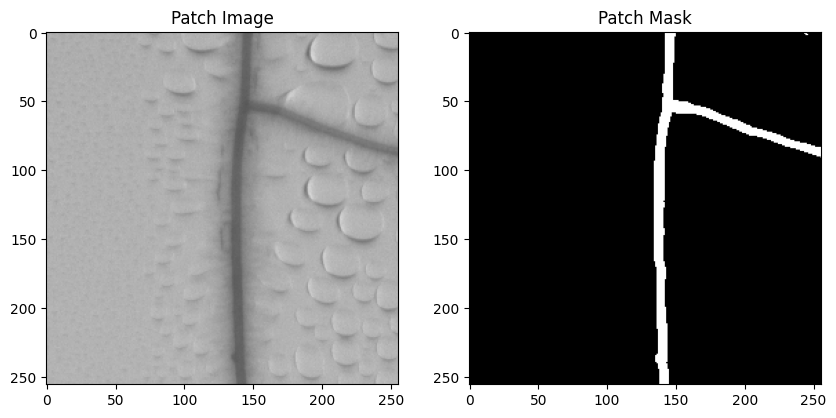

In [27]:
# Example to visualize a patch
patch_image_path = "/Volumes/T7/Artificial Intelligence/YEAR 2.1/Block B retake/dataset/train_images/train/train_Alican_212231_im1_patch_38.png"
patch_mask_path = "/Volumes/T7/Artificial Intelligence/YEAR 2.1/Block B retake/dataset/train_masks/train/train_Alican_212231_im1_patch_38.tif"

img_patch = cv2.imread(patch_image_path)
mask_patch = cv2.imread(patch_mask_path, cv2.IMREAD_GRAYSCALE)

plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.imshow(cv2.cvtColor(img_patch, cv2.COLOR_BGR2RGB))
plt.title("Patch Image")
plt.subplot(1, 2, 2)
plt.imshow(mask_patch, cmap="gray")
plt.title("Patch Mask")
plt.show()